In [1]:
import requests   # Importing requests to extract content from a url
from bs4 import BeautifulSoup as bs # Beautifulsoup is for web scrapping...used to scrap specific content 
import re 
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [2]:
# creating empty reviews list 
movie_reviews=[]


In [3]:
for i in range(1,21):
  ip=[]  
  url="https://www.imdb.com/title/tt5433138/reviews?ref_=tt_urv"+str(i)
  response = requests.get(url)
  soup = bs(response.content,"html.parser")# creating soup object to iterate over the extracted content 
  reviews = soup.find_all("div", attrs={"class": "text show-more__control"})# Extracting the content under specific tags  
  for i in range(len(reviews)):
    ip.append(reviews[i].text)  

    movie_reviews= movie_reviews+ip  # adding the reviews of one page to empty list which in future contains all the reviews


In [4]:
movie_reviews

["I usually enjoy this franchise and have seen every movie multiple times. Unfortunately F9 was the most ridiculous, unbelievable, far fetched nonsense I've ever seen. It was so dumb to the point that I wasn't entertained. Talk about disappointing.",
 "I usually enjoy this franchise and have seen every movie multiple times. Unfortunately F9 was the most ridiculous, unbelievable, far fetched nonsense I've ever seen. It was so dumb to the point that I wasn't entertained. Talk about disappointing.",
 "I felt compelled to write this review one hour into the movie (couldn't carry on for obvious reasons)...\nWe all knew the franchise was steadily worsening but this one takes the cake. I don't think you can make something utterly ridiculous even on purpose.Only question I would like to ask the cast is do they actually care about F&F like we the fans do/did or was it just a big lie right from the start?A person with some kind of self-esteem wouldn't embarrass him/herself this way.P. S. Charliz

In [5]:
# writng reviews in a text file 
with open("movie-reviews.txt","w",encoding='utf8') as output:
    output.write(str(movie_reviews))

In [6]:
# Joinining all the reviews into single paragraph 
ip_rev_string = " ".join(movie_reviews)

In [7]:
import nltk
# from nltk.corpus import stopwords|

In [8]:
# Removing unwanted symbols incase if exists
ip_rev_string = re.sub("[^A-Za-z" "]+"," ", ip_rev_string).lower()
ip_rev_string = re.sub("[0-9" "]+"," ", ip_rev_string)

In [9]:
# words that contained in iphone XR reviews
ip_reviews_words = ip_rev_string.split(" ")
ip_reviews_words

['i',
 'usually',
 'enjoy',
 'this',
 'franchise',
 'and',
 'have',
 'seen',
 'every',
 'movie',
 'multiple',
 'times',
 'unfortunately',
 'f',
 'was',
 'the',
 'most',
 'ridiculous',
 'unbelievable',
 'far',
 'fetched',
 'nonsense',
 'i',
 've',
 'ever',
 'seen',
 'it',
 'was',
 'so',
 'dumb',
 'to',
 'the',
 'point',
 'that',
 'i',
 'wasn',
 't',
 'entertained',
 'talk',
 'about',
 'disappointing',
 'i',
 'usually',
 'enjoy',
 'this',
 'franchise',
 'and',
 'have',
 'seen',
 'every',
 'movie',
 'multiple',
 'times',
 'unfortunately',
 'f',
 'was',
 'the',
 'most',
 'ridiculous',
 'unbelievable',
 'far',
 'fetched',
 'nonsense',
 'i',
 've',
 'ever',
 'seen',
 'it',
 'was',
 'so',
 'dumb',
 'to',
 'the',
 'point',
 'that',
 'i',
 'wasn',
 't',
 'entertained',
 'talk',
 'about',
 'disappointing',
 'i',
 'felt',
 'compelled',
 'to',
 'write',
 'this',
 'review',
 'one',
 'hour',
 'into',
 'the',
 'movie',
 'couldn',
 't',
 'carry',
 'on',
 'for',
 'obvious',
 'reasons',
 'we',
 'all',
 

In [10]:
#TFIDF
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(ip_reviews_words, use_idf=True,ngram_range=(1, 3))
X = vectorizer.fit_transform(ip_reviews_words)

C:\Program Files\Python39\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass input=['i', 'usually', 'enjoy', 'this', 'franchise', 'and', 'have', 'seen', 'every', 'movie', 'multiple', 'times', 'unfortunately', 'f', 'was', 'the', 'most', 'ridiculous', 'unbelievable', 'far', 'fetched', 'nonsense', 'i', 've', 'ever', 'seen', 'it', 'was', 'so', 'dumb', 'to', 'the', 'point', 'that', 'i', 'wasn', 't', 'entertained', 'talk', 'about', 'disappointing', 'i', 'usually', 'enjoy', 'this', 'franchise', 'and', 'have', 'seen', 'every', 'movie', 'multiple', 'times', 'unfortunately', 'f', 'was', 'the', 'most', 'ridiculous', 'unbelievable', 'far', 'fetched', 'nonsense', 'i', 've', 'ever', 'seen', 'it', 'was', 'so', 'dumb', 'to', 'the', 'point', 'that', 'i', 'wasn', 't', 'entertained', 'talk', 'about', 'disappointing', 'i', 'felt', 'compelled', 'to', 'write', 'this', 'review', 'one', 'hour', 'into', 'the', 'movie', 'couldn', 't', 'carry', 'on', 'for', 'obvious', 'reasons', 'we', 'all', '

In [11]:
with open("stop.txt","r") as sw:
    stop_words = sw.read()

In [12]:
stop_words = stop_words.split("\n")

stop_words.extend(["imdb","laptop","time","windows","laptop","device","screen","battery","product","good","day","price"])


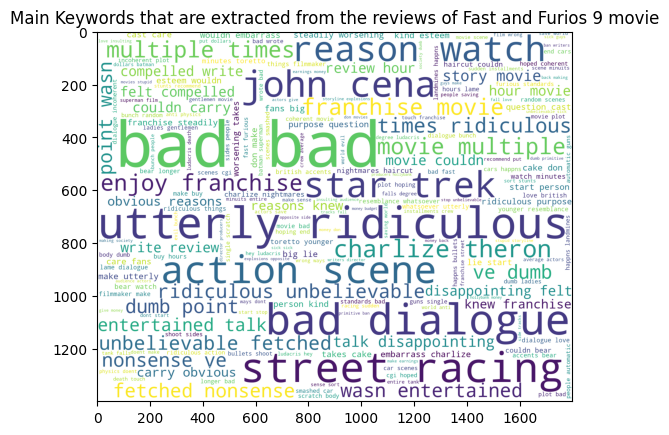

In [13]:
ip_reviews_words = [w for w in ip_reviews_words if not w in stop_words]

# Joinining all the reviews into single paragraph 
ip_rev_string = " ".join(ip_reviews_words)
wordcloud_ip = WordCloud(
                      background_color='White',
                      width=1800,
                      height=1400
                     ).generate(ip_rev_string)

plt.imshow(wordcloud_ip)
plt.title("Main Keywords that are extracted from the reviews of Fast and Furios 9 movie")
plt.show()

In [14]:
# WordCloud can be performed on the string inputs.
# Corpus level word cloud
# positive words # Choose the path for +ve words stored in system
with open(r"positive-words.txt","r") as pos:
  poswords = pos.read().split("\n")

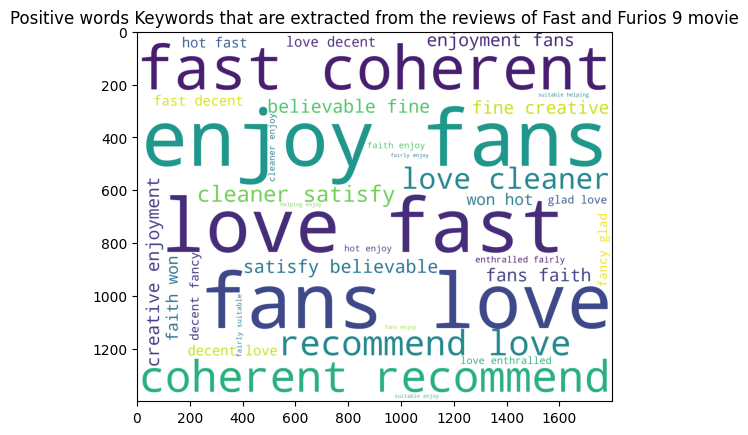

In [15]:
# Positive word cloud
# Choosing the only words which are present in positive words
ip_pos_in_pos = " ".join ([w for w in ip_reviews_words if w in poswords])

wordcloud_pos_in_pos = WordCloud(
                      background_color='White',
                      width=1800,
                      height=1400
                     ).generate(ip_pos_in_pos)
plt.figure(2)
plt.title("Positive words Keywords that are extracted from the reviews of Fast and Furios 9 movie")
plt.imshow(wordcloud_pos_in_pos)
plt.show()

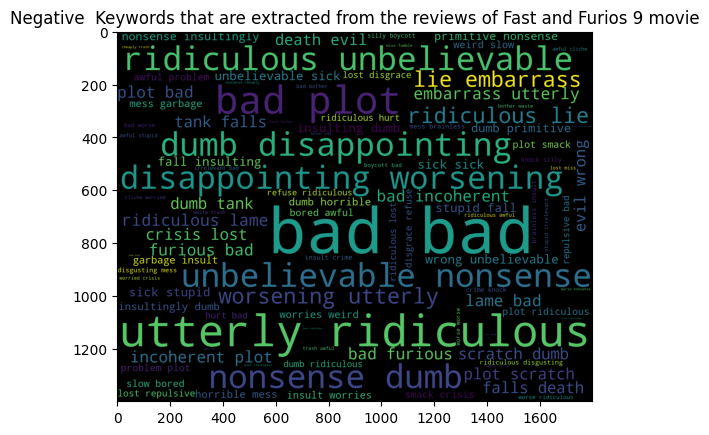

In [16]:
# negative words Choose path for -ve words stored in system
with open(r"negative-words.txt", "r") as neg:
  negwords = neg.read().split("\n")

# negative word cloud
# Choosing the only words which are present in negwords
ip_neg_in_neg = " ".join ([w for w in ip_reviews_words if w in negwords])

wordcloud_neg_in_neg = WordCloud(
                      background_color='black',
                      width=1800,
                      height=1400
                     ).generate(ip_neg_in_neg)
plt.figure(3)
plt.title("Negative  Keywords that are extracted from the reviews of Fast and Furios 9 movie")
plt.imshow(wordcloud_neg_in_neg)
plt.show()

# **Word cloud with Bigram**

In [17]:
# wordcloud with bigram
nltk.download('punkt')
from wordcloud import WordCloud, STOPWORDS

[nltk_data] Downloading package punkt to C:\Users\Shrey Kumar
[nltk_data]     Soni\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [18]:
WNL = nltk.WordNetLemmatizer() # it groups up similar word i.e words with similar meaning

# Lowercase and tokenize
text = ip_rev_string.lower()

# Remove single quote early since it causes problems with the tokenizer.
text = text.replace("'", "")

In [19]:
tokens = nltk.word_tokenize(text)
text1 = nltk.Text(tokens)

# Remove extra chars and remove stop words.
text_content = [''.join(re.split("[ .,;:!?‘’``''@#$%^_&*()<>{}~\n\t\\\-]", word)) for word in text1]
text_content

['enjoy',
 'franchise',
 'movie',
 'multiple',
 'times',
 'ridiculous',
 'unbelievable',
 'fetched',
 'nonsense',
 've',
 'dumb',
 'point',
 'wasn',
 'entertained',
 'talk',
 'disappointing',
 'enjoy',
 'franchise',
 'movie',
 'multiple',
 'times',
 'ridiculous',
 'unbelievable',
 'fetched',
 'nonsense',
 've',
 'dumb',
 'point',
 'wasn',
 'entertained',
 'talk',
 'disappointing',
 'felt',
 'compelled',
 'write',
 'review',
 'hour',
 'movie',
 'couldn',
 'carry',
 'obvious',
 'reasons',
 'knew',
 'franchise',
 'steadily',
 'worsening',
 'takes',
 'cake',
 'don',
 'make',
 'utterly',
 'ridiculous',
 'purpose',
 'question',
 'cast',
 'care',
 'fans',
 'big',
 'lie',
 'start',
 'person',
 'kind',
 'esteem',
 'wouldn',
 'embarrass',
 'charlize',
 'nightmares',
 'haircut',
 'enjoy',
 'franchise',
 'movie',
 'multiple',
 'times',
 'ridiculous',
 'unbelievable',
 'fetched',
 'nonsense',
 've',
 'dumb',
 'point',
 'wasn',
 'entertained',
 'talk',
 'disappointing',
 'felt',
 'compelled',
 'writ

In [20]:
# Create a set of stopwords
stopwords_wc = set(STOPWORDS)
customised_words = ['price', 'great'] # If you want to remove any particular word form text which does not contribute much in meaning


In [21]:
new_stopwords = stopwords_wc.union(customised_words)
# Remove stop words
text_content = [word for word in text_content if word not in new_stopwords]

# Take only non-empty entries
text_content = [s for s in text_content if len(s) != 0]

In [22]:
# Best to get the lemmas of each word to reduce the number of similar words
text_content = [WNL.lemmatize(t) for t in text_content]

In [23]:
nltk_tokens = nltk.word_tokenize(text)  
bigrams_list = list(nltk.bigrams(text_content))
print(bigrams_list)

[('enjoy', 'franchise'), ('franchise', 'movie'), ('movie', 'multiple'), ('multiple', 'time'), ('time', 'ridiculous'), ('ridiculous', 'unbelievable'), ('unbelievable', 'fetched'), ('fetched', 'nonsense'), ('nonsense', 've'), ('ve', 'dumb'), ('dumb', 'point'), ('point', 'wasn'), ('wasn', 'entertained'), ('entertained', 'talk'), ('talk', 'disappointing'), ('disappointing', 'enjoy'), ('enjoy', 'franchise'), ('franchise', 'movie'), ('movie', 'multiple'), ('multiple', 'time'), ('time', 'ridiculous'), ('ridiculous', 'unbelievable'), ('unbelievable', 'fetched'), ('fetched', 'nonsense'), ('nonsense', 've'), ('ve', 'dumb'), ('dumb', 'point'), ('point', 'wasn'), ('wasn', 'entertained'), ('entertained', 'talk'), ('talk', 'disappointing'), ('disappointing', 'felt'), ('felt', 'compelled'), ('compelled', 'write'), ('write', 'review'), ('review', 'hour'), ('hour', 'movie'), ('movie', 'couldn'), ('couldn', 'carry'), ('carry', 'obvious'), ('obvious', 'reason'), ('reason', 'knew'), ('knew', 'franchise'),

In [24]:
dictionary2 = [' '.join(tup) for tup in bigrams_list]
print (dictionary2)

['enjoy franchise', 'franchise movie', 'movie multiple', 'multiple time', 'time ridiculous', 'ridiculous unbelievable', 'unbelievable fetched', 'fetched nonsense', 'nonsense ve', 've dumb', 'dumb point', 'point wasn', 'wasn entertained', 'entertained talk', 'talk disappointing', 'disappointing enjoy', 'enjoy franchise', 'franchise movie', 'movie multiple', 'multiple time', 'time ridiculous', 'ridiculous unbelievable', 'unbelievable fetched', 'fetched nonsense', 'nonsense ve', 've dumb', 'dumb point', 'point wasn', 'wasn entertained', 'entertained talk', 'talk disappointing', 'disappointing felt', 'felt compelled', 'compelled write', 'write review', 'review hour', 'hour movie', 'movie couldn', 'couldn carry', 'carry obvious', 'obvious reason', 'reason knew', 'knew franchise', 'franchise steadily', 'steadily worsening', 'worsening take', 'take cake', 'cake don', 'don make', 'make utterly', 'utterly ridiculous', 'ridiculous purpose', 'purpose question', 'question cast', 'cast care', 'care

In [25]:
# Using count vectoriser to view the frequency of bigrams
from sklearn.feature_extraction.text import CountVectorizer

In [26]:
vectorizer = CountVectorizer(ngram_range=(2, 2))
bag_of_words = vectorizer.fit_transform(dictionary2)
vectorizer.vocabulary_

{'enjoy franchise': 184,
 'franchise movie': 245,
 'movie multiple': 401,
 'multiple time': 416,
 'time ridiculous': 620,
 'ridiculous unbelievable': 508,
 'unbelievable fetched': 640,
 'fetched nonsense': 218,
 'nonsense ve': 421,
 've dumb': 649,
 'dumb point': 173,
 'point wasn': 453,
 'wasn entertained': 657,
 'entertained talk': 187,
 'talk disappointing': 603,
 'disappointing enjoy': 151,
 'disappointing felt': 152,
 'felt compelled': 216,
 'compelled write': 114,
 'write review': 691,
 'review hour': 502,
 'hour movie': 302,
 'movie couldn': 396,
 'couldn carry': 121,
 'carry obvious': 90,
 'obvious reason': 424,
 'reason knew': 491,
 'knew franchise': 326,
 'franchise steadily': 247,
 'steadily worsening': 571,
 'worsening take': 688,
 'take cake': 601,
 'cake don': 76,
 'don make': 165,
 'make utterly': 373,
 'utterly ridiculous': 648,
 'ridiculous purpose': 506,
 'purpose question': 469,
 'question cast': 474,
 'cast care': 93,
 'care fan': 89,
 'fan big': 206,
 'big lie': 45

In [27]:
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
print(words_freq[:100])

[('bad bad', 1200), ('utterly ridiculous', 940), ('bad dialogue', 880), ('street racing', 840), ('action scene', 720), ('john cena', 640), ('star trek', 620), ('reason watch', 600), ('charlize theron', 580), ('enjoy franchise', 500), ('franchise movie', 500), ('movie multiple', 500), ('multiple time', 500), ('time ridiculous', 500), ('ridiculous unbelievable', 500), ('unbelievable fetched', 500), ('fetched nonsense', 500), ('nonsense ve', 500), ('ve dumb', 500), ('dumb point', 500), ('point wasn', 500), ('wasn entertained', 500), ('entertained talk', 500), ('talk disappointing', 500), ('story movie', 500), ('disappointing felt', 480), ('felt compelled', 480), ('compelled write', 480), ('write review', 480), ('review hour', 480), ('hour movie', 480), ('movie couldn', 480), ('couldn carry', 480), ('carry obvious', 480), ('obvious reason', 480), ('reason knew', 480), ('knew franchise', 480), ('franchise steadily', 480), ('steadily worsening', 480), ('worsening take', 480), ('take cake', 4

<Figure size 7000x10000 with 0 Axes>

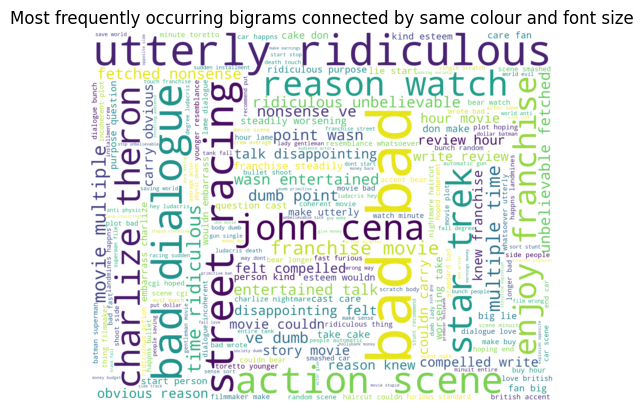

In [28]:
# Generating wordcloud
words_dict = dict(words_freq)
WC_height = 2000
WC_width = 2500
WC_max_words = 200
wordCloud = WordCloud(background_color='white',max_words=WC_max_words, height=WC_height, width=WC_width, stopwords=new_stopwords)
wordCloud.generate_from_frequencies(words_dict)

plt.figure(figsize= (70,100))
plt.figure(4)
plt.title('Most frequently occurring bigrams connected by same colour and font size')
plt.imshow(wordCloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [29]:
import pandas as pd
df = pd.DataFrame(words_freq, columns = ['Words', 'Ocuurence'])
df

,Words,Ocuurence
0,bad bad,1200
1,utterly ridiculous,940
2,bad dialogue,880
3,street racing,840
4,action scene,720
...,...,...
697,confued realize,20
698,realize helping,20
699,helping team,20
700,team surviving,20


In [30]:
from nltk.corpus import stopwords

In [31]:
# Lemmatization
# Lemmatization looks into dictionary words
nltk.download('wordnet')
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package wordnet to C:\Users\Shrey Kumar
[nltk_data]     Soni\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [32]:
lemmatizer = WordNetLemmatizer()
for i in df["Words"]:
    lemmatizer.lemmatize(i)
    

In [33]:
 #Chunking (Shallow Parsing) - Identifying named entities
nltk.download('maxent_ne_chunker')
nltk.download('words')

[nltk_data] Downloading package maxent_ne_chunker to C:\Users\Shrey
[nltk_data]     Kumar Soni\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to C:\Users\Shrey Kumar
[nltk_data]     Soni\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [34]:
# Number of words
from textblob import TextBlob

In [35]:
# Detect presence of wh words
wh_words = set(['why', 'who', 'which', 'what', 'where', 'when', 'how'])
df['is_wh_words_present'] = df['Words'].apply(lambda x : True if len(set(TextBlob(str(x)).words).intersection(wh_words))>0 else False)
df['is_wh_words_present']

0      False
1      False
2      False
3      False
4      False
       ...  
697    False
698    False
699    False
700    False
701    False
Name: is_wh_words_present, Length: 702, dtype: bool

In [36]:
# Polarity
df['polarity'] = df['Words'].apply(lambda x : TextBlob(str(x)).sentiment.polarity)
df['polarity']

0     -0.700000
1     -0.333333
2     -0.700000
3      0.000000
4      0.100000
         ...   
697    0.000000
698    0.000000
699    0.000000
700    0.000000
701    0.400000
Name: polarity, Length: 702, dtype: float64

In [37]:
# Subjectivity
df['subjectivity'] = df['Words'].apply(lambda x : TextBlob(str(x)).sentiment.subjectivity)
df['subjectivity']

0      0.666667
1      1.000000
2      0.666667
3      0.000000
4      0.100000
         ...   
697    0.000000
698    0.000000
699    0.000000
700    0.000000
701    0.500000
Name: subjectivity, Length: 702, dtype: float64

In [38]:
df.head(5)

,Words,Ocuurence,is_wh_words_present,polarity,subjectivity
0,bad bad,1200,False,-0.700000,0.666667
1,utterly ridiculous,940,False,-0.333333,1.000000
2,bad dialogue,880,False,-0.700000,0.666667
3,street racing,840,False,0.000000,0.000000
4,action scene,720,False,0.100000,0.100000


In [39]:
# assign reviews with score > 3 as positive sentiment
# score < 3 negative sentiment
# remove score = 3
df = df[df['polarity'] != 0]
df['sentiment'] = df['polarity'].apply(lambda rating : +1 if rating > 0 else -1)

<ipython-input-39-ca2b0f55f756>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sentiment'] = df['polarity'].apply(lambda rating : +1 if rating > 0 else -1)


In [40]:
df.head(10)

,Words,Ocuurence,is_wh_words_present,polarity,subjectivity,sentiment
0,bad bad,1200,False,-0.700000,0.666667,-1
1,utterly ridiculous,940,False,-0.333333,1.000000,-1
2,bad dialogue,880,False,-0.700000,0.666667,-1
4,action scene,720,False,0.100000,0.100000,1
9,enjoy franchise,500,False,0.400000,0.500000,1
13,time ridiculous,500,False,-0.333333,1.000000,-1
14,ridiculous unbelievable,500,False,-0.291667,1.000000,-1
15,unbelievable fetched,500,False,-0.250000,1.000000,-1
18,ve dumb,500,False,-0.375000,0.500000,-1
19,dumb point,500,False,-0.375000,0.500000,-1


In [41]:
# split df - positive and negative sentiment:
positive = df[df['sentiment'] == 1]
negative = df[df['sentiment'] == -1]

In [45]:
import plotly.express as px

In [46]:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentimentt")
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text=' Fast and Furios 9 Movie reviews Sentiment Analysis')
fig.show()

<ipython-input-46-d633ace6a3f1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
<ipython-input-46-d633ace6a3f1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})


In [ ]:
df

,Words,Ocuurence,is_wh_words_present,polarity,subjectivity,sentiment,sentimentt
0,utterly ridiculous,960,False,-0.333333,1.000000,-1,negative
2,bad bad,880,False,-0.700000,0.666667,-1,negative
3,bad dialogue,880,False,-0.700000,0.666667,-1,negative
5,action scene,660,False,0.100000,0.100000,1,positive
8,movie bad,540,False,-0.700000,0.666667,-1,negative
...,...,...,...,...,...,...,...
687,endless amount,20,False,-0.125000,0.750000,-1,negative
688,amount unnecessary,20,False,-0.400000,0.900000,-1,negative
689,unnecessary sequel,20,False,-0.400000,0.900000,-1,negative
701,freakish destructive,20,False,-0.600000,0.600000,-1,negative


In [ ]:
dfNew = df[['Words','sentiment']]
dfNew.head()

,Words,sentiment
0,utterly ridiculous,-1
2,bad bad,-1
3,bad dialogue,-1
5,action scene,1
8,movie bad,-1


In [ ]:
import numpy as np

In [ ]:
# random split train and test data
index = df.index
df['random_number'] = np.random.randn(len(index))
train = df[df['random_number'] <= 0.8]
test = df[df['random_number'] > 0.8]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# count vectorizer:
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['Words'])
test_matrix = vectorizer.transform(test['Words'])

In [ ]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [ ]:
X_train = train_matrix
X_test = test_matrix
y_train = train['sentiment']
y_test = test['sentiment']

In [ ]:
lr.fit(X_train,y_train)

LogisticRegression()

In [ ]:
predictions = lr.predict(X_test)
predictions

array([ 1, -1, -1, -1, -1, -1,  1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1,  1,  1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  1, -1,
       -1, -1,  1, -1, -1, -1, -1, -1,  1, -1, -1, -1], dtype=int64)

In [ ]:
# find accuracy, precision, recall:
from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[28, 11],
       [ 2,  5]], dtype=int64)

In [ ]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.93      0.72      0.81        39
           1       0.31      0.71      0.43         7

    accuracy                           0.72        46
   macro avg       0.62      0.72      0.62        46
weighted avg       0.84      0.72      0.75        46



# **Extra Part**

In [ ]:
corpus = [ip_rev_string]

bag_of_words_model = CountVectorizer()
print(bag_of_words_model.fit_transform(corpus).todense()) # bag of words

[[ 460 1000  500  120   80   80   20   40   20  400   20  320  240  120
    20  420  220  400  180  140  220 3480  140  400  240  920  100   80
    80  500   80  420  120  100   80  140   80  200  220  400  320   40
   320  460  400  300  100  420  920   40  460  500  560  120 1260  240
   500  500   20  780  360  100  500  780  580   20  120  320 1180  300
   260  140  220  240   40  100  440   40  500  120   20  320  320  120
   120 1100  240  260   40  600  300  400  320  180  360  120  420   20
   420   40  220   80   20 1340  280   60  140  360   20  480  300  300
   320  400  700  400  100  300 1180  460  200  220   60   40  200 1200
   380   40  500  780   20  240  480   60  300  780  420  300  240  500
   400  260  180   20   80  140  300  420  380  360  100  840  220  480
   360  100  500  220  480  200  100 1180  460  840  320  380   80  100
   200   60   80   20 2660  300   20  300  480   40  320  340  420   80
    80  340  100  200  200   20  200   80  420  100  680 1080  8

In [ ]:
bag_of_word_df = pd.DataFrame(bag_of_words_model.fit_transform(corpus).todense())
bag_of_word_df.columns = sorted(bag_of_words_model.vocabulary_)
bag_of_word_df.head()

,accents,action,actors,actual,addiction,american,amount,angling,antagonists,anti,...,worse,worsening,wouldn,wrecking,write,written,wrong,wrote,year,younger
0,460,1000,500,120,80,80,20,40,20,400,...,620,500,500,80,500,340,400,440,700,460


In [ ]:
# Bag of word model for top 5 frequent terms
bag_of_words_model_small = CountVectorizer(max_features=5)
bag_of_word_df_small = pd.DataFrame(bag_of_words_model_small.fit_transform(corpus).todense())
bag_of_word_df_small.columns = sorted(bag_of_words_model_small.vocabulary_)
bag_of_word_df_small.head()

,bad,franchise,make,movie,ridiculous
0,3480,2660,2200,4620,2360


In [ ]:
# TFIDF
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
tfidf_model = TfidfVectorizer()
print(tfidf_model.fit_transform(corpus).todense())

[[0.03964162 0.08617744 0.04308872 0.01034129 0.0068942  0.0068942
  0.00172355 0.0034471  0.00172355 0.03447098 0.00172355 0.02757678
  0.02068259 0.01034129 0.00172355 0.03619453 0.01895904 0.03447098
  0.01551194 0.01206484 0.01895904 0.2998975  0.01206484 0.03447098
  0.02068259 0.07928325 0.00861774 0.0068942  0.0068942  0.04308872
  0.0068942  0.03619453 0.01034129 0.00861774 0.0068942  0.01206484
  0.0068942  0.01723549 0.01895904 0.03447098 0.02757678 0.0034471
  0.02757678 0.03964162 0.03447098 0.02585323 0.00861774 0.03619453
  0.07928325 0.0034471  0.03964162 0.04308872 0.04825937 0.01034129
  0.10858358 0.02068259 0.04308872 0.04308872 0.00172355 0.0672184
  0.03102388 0.00861774 0.04308872 0.0672184  0.04998292 0.00172355
  0.01034129 0.02757678 0.10168938 0.02585323 0.02240613 0.01206484
  0.01895904 0.02068259 0.0034471  0.00861774 0.03791807 0.0034471
  0.04308872 0.01034129 0.00172355 0.02757678 0.02757678 0.01034129
  0.01034129 0.09479519 0.02068259 0.02240613 0.0034

In [ ]:
tfidf_df = pd.DataFrame(tfidf_model.fit_transform(corpus).todense())
tfidf_df.columns = sorted(tfidf_model.vocabulary_)
tfidf_df.head()

,accents,action,actors,actual,addiction,american,amount,angling,antagonists,anti,...,worse,worsening,wouldn,wrecking,write,written,wrong,wrote,year,younger
0,0.039642,0.086177,0.043089,0.010341,0.006894,0.006894,0.001724,0.003447,0.001724,0.034471,...,0.05343,0.043089,0.043089,0.006894,0.043089,0.0293,0.034471,0.037918,0.060324,0.039642


In [ ]:
# TFIDF for top 5 frequent terms
tfidf_model_small = TfidfVectorizer(max_features=5)
tfidf_df_small = pd.DataFrame(tfidf_model_small.fit_transform(corpus).todense())
tfidf_df_small.columns = sorted(tfidf_model_small.vocabulary_)
tfidf_df_small.head()

,bad,franchise,make,movie,ridiculous
0,0.487584,0.372694,0.308243,0.64731,0.330661
